In [1]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")
    
%matplotlib inline

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import pandas as pd 
import numpy as np

import matplotlib.pyplot as plt

from sklearn.preprocessing import scale

## Load Data

In [2]:
server = pd.read_csv('./server_utilization.csv')
df_server = server[['max_util']]
df_server['hashed_id'] = server['asset_id'].apply(hash)

In [3]:
# server_group = df_server.groupby('hashed_id')['max_util'].apply(lambda server: server.reset_index(drop=True)).unstack()
server_group = df_server.groupby('max_util').apply(lambda server: server.reset_index(drop=True))
server_group.head(100000)

max_util            hashed_id
max_util                                 
0.000    0     0.000  7965941028859700562
         1     0.000  9040053991202546380
         2     0.000  3403642394276602520
         3     0.000  3403642394276602520
0.078    0     0.078 -4572855720908137379
...              ...                  ...
99.980   1    99.980  3778808927879515402
99.983   0    99.983  6676003064926551587
100.000  0   100.000  7965941028859700562
         1   100.000 -5795990513676089332
         2   100.000 -5795990513676089332

[23553 rows x 2 columns]

In [4]:
# from sklearn.preprocessing import OneHotEncoder
# x = OneHotEncoder().fit_transform(server_group)
x = server_group
x[x.columns] = scale(x[x.columns])
x.head()

max_util  hashed_id
max_util                       
0.000    0 -0.917376   1.457041
         1 -0.917376   1.661381
         2 -0.917376   0.589106
         3 -0.917376   0.589106
0.078    0 -0.912434  -0.928349

In [5]:
from sklearn.cluster import KMeans

model = KMeans(n_clusters=5, random_state=1)
model.fit(x)
kMeans_labels = model.labels_

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=1, tol=0.0001, verbose=0)

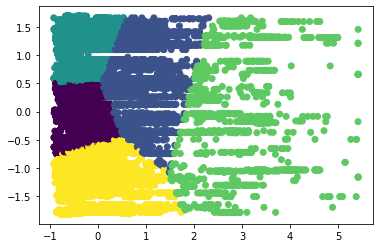

In [6]:
plt.scatter(x['max_util'], x['hashed_id'],c=kMeans_labels)

In [7]:
from sklearn.metrics import silhouette_score

silhouette_score(x, kMeans_labels)

0.3953601095227218

In [8]:
# Function for k-means clustering

def cluster_kMeans(x, k):
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(x)
    kMeans_labels = model.labels_
    kMeans_sil_score = silhouette_score(x, kMeans_labels)
    return (kMeans_labels, kMeans_sil_score)

In [9]:
# Iterate over differenv values of ka to determine the one giving the highest silhouette score

for k in range(2,16):
    kMeans_labels, kMeans_sil_score = cluster_kMeans(x,k)
    print('k: ', k, '\t\t', 'Silhoutte score:', kMeans_sil_score)

k:  2 		 Silhoutte score: 0.42084290916166917
k:  3 		 Silhoutte score: 0.49606659740000014
k:  4 		 Silhoutte score: 0.46956782647715867
k:  5 		 Silhoutte score: 0.3953601095227218
k:  6 		 Silhoutte score: 0.4130190881311893
k:  7 		 Silhoutte score: 0.3853198175612284
k:  8 		 Silhoutte score: 0.3851985627318507
k:  9 		 Silhoutte score: 0.3875720231723794
k:  10 		 Silhoutte score: 0.3982911192247804
k:  11 		 Silhoutte score: 0.4062750183201024
k:  12 		 Silhoutte score: 0.4059805594933954
k:  13 		 Silhoutte score: 0.4089813072342364
k:  14 		 Silhoutte score: 0.40590824747484305
k:  15 		 Silhoutte score: 0.41948200973891997


In [10]:
from sklearn.cluster import AgglomerativeClustering

h_model = AgglomerativeClustering(n_clusters=3)
h_model.fit(x)
hCluster_labels = h_model.labels_

silhouette_score(x, hCluster_labels)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=3)

0.443380206176387

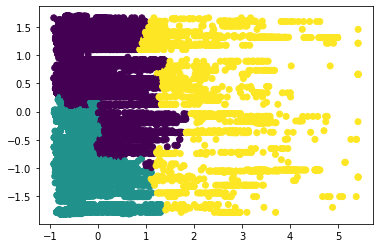

In [11]:
plt.scatter(x['max_util'], x['hashed_id'],c=hCluster_labels)

In [12]:
from sklearn.cluster import DBSCAN

db_model = DBSCAN(eps=0.5)
db_model.fit(x)
dbscan_labels = db_model.labels_

silhouette_score(x, dbscan_labels)

DBSCAN(algorithm='auto', eps=0.5, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=None, p=None)

0.6625542599722205

In [13]:
dbscan_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
dbscan_noise = list(dbscan_labels).count(-1)

print('Clusters: ', dbscan_clusters, '\t\t', 'Noise: ', dbscan_noise)

Clusters:  2 		 Noise:  0


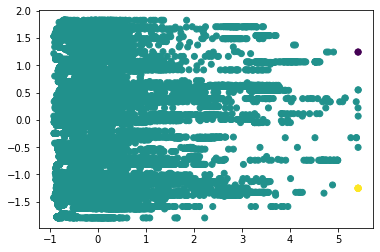

In [15]:
plt.scatter(x['max_util'], x['hashed_id'],c=dbscan_labels)

## Conclusions

From what has been observed, dbscan and hclustering doesnt really make sense in this case, however Kmeans shows some promising results with a k value of 3, 4 and 6 for clustering this set of data based off the CPU utilization patterns.